In [1]:
!pip install plotly --upgrade

In [2]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
from sklearn.preprocessing import StandardScaler

# K-means

## Base idade e salário

In [3]:
from sklearn.cluster import KMeans

In [4]:
x=[20,  27,  21,  37,  46, 53, 55,  47,  52,  32,  39,  41,  39,  48,  48]  
y=[1000,1200,2900,1850,900,950,2000,2100,3000,5900,4100,5100,7000,5000,6500]

In [5]:
grafico = px.scatter(x = x, y = y)
grafico.show()

In [6]:
base_salario = np.array([[20,1000],[27,1200],[21,2900],[37,1850],[46,900],
                        [53,950],[55,2000],[47,2100],[52,3000],[32,5900],
                        [39,4100],[41,5100],[39,7000],[48,5000],[48,6500]])

In [7]:
#Obs. temos a base no formato de matiz, observando os dois [[ ]]
base_salario

array([[  20, 1000],
       [  27, 1200],
       [  21, 2900],
       [  37, 1850],
       [  46,  900],
       [  53,  950],
       [  55, 2000],
       [  47, 2100],
       [  52, 3000],
       [  32, 5900],
       [  39, 4100],
       [  41, 5100],
       [  39, 7000],
       [  48, 5000],
       [  48, 6500]])

In [8]:
scaler_salario = StandardScaler()
base_salario = scaler_salario.fit_transform(base_salario)

In [9]:
#agora temos os dados padronizados para passar pro algoritmo e treinar
base_salario

array([[-1.87963884, -1.11413572],
       [-1.23255006, -1.01725435],
       [-1.78719758, -0.19376273],
       [-0.30813751, -0.70238991],
       [ 0.52383377, -1.1625764 ],
       [ 1.17092255, -1.13835606],
       [ 1.35580506, -0.62972888],
       [ 0.61627503, -0.5812882 ],
       [ 1.0784813 , -0.14532205],
       [-0.77034379,  1.25945777],
       [-0.12325501,  0.38752547],
       [ 0.0616275 ,  0.8719323 ],
       [-0.12325501,  1.79230528],
       [ 0.70871628,  0.82349162],
       [ 0.70871628,  1.55010187]])

In [10]:
kmeans_salario = KMeans(n_clusters=3)

#o .fit vai fazer todos os calculos 
kmeans_salario.fit(base_salario)

#apos a execução temos os algoritmos prontos

KMeans(n_clusters=3)

In [11]:
#Aqui vamos ter um centroide para cada um dos clusters, 
# lembrando que cada um desses centroides são as médias que compões ao cluster

centroides = kmeans_salario.cluster_centers_
centroides

array([[ 0.07703438,  1.11413572],
       [ 0.73953003, -0.72661025],
       [-1.63312883, -0.77505093]])

In [12]:
#Para observar melhor os dados reais, fazemos o processo inverso, chamando o scarler

scaler_salario.inverse_transform(kmeans_salario.cluster_centers_)

array([[  41.16666667, 5600.        ],
       [  48.33333333, 1800.        ],
       [  22.66666667, 1700.        ]])

In [13]:
# Aqui vamos observar cada um dos grupos que compõe os registros, o registro 0, o registro 1, o registro 2.

rotulos = kmeans_salario.labels_
rotulos

array([2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], dtype=int32)

In [14]:
grafico1 = px.scatter(x = base_salario[:,0], y = base_salario[:,1], color=rotulos)
grafico2 = px.scatter(x = centroides[:,0], y = centroides[:,1], size = [12, 12, 12])
grafico3 = go.Figure(data = grafico1.data + grafico2.data)
grafico3.show()

# Dados Randômicos 

In [15]:
from sklearn.datasets import make_blobs

In [16]:
x_random, y_random = make_blobs(n_samples=200, centers=5, random_state=1)

In [17]:
x_random

array([[-1.96576392e+00,  5.23446451e+00],
       [-5.16022348e+00, -7.04217141e+00],
       [-6.17937069e+00, -2.16733539e+00],
       [-7.39138168e+00, -9.49590389e+00],
       [-6.38481234e+00, -8.47302970e+00],
       [-6.26144310e+00, -3.78347905e+00],
       [-2.04278768e+00,  3.07660864e-01],
       [-4.46426086e+00, -4.39451238e+00],
       [-6.40386190e+00, -6.36106990e+00],
       [ 2.42271161e-04,  5.14853403e+00],
       [-5.99212006e+00, -3.91488289e+00],
       [-6.46137477e+00, -3.14560994e+00],
       [-4.10185174e+00, -1.16625450e+00],
       [-1.01341572e+01, -4.07240274e+00],
       [-5.99004766e+00, -2.82631801e+00],
       [-1.14663009e+00,  4.10839703e+00],
       [-1.17104176e+00,  4.33091816e+00],
       [-9.19585147e+00, -3.90678125e+00],
       [-8.30173556e+00, -7.27738918e+00],
       [-7.56309575e+00, -8.46421308e+00],
       [-1.86845414e+00,  4.99311306e+00],
       [-4.22362233e+00, -2.50312346e+00],
       [-1.90838667e+00,  5.86113655e-01],
       [-6.

In [18]:
y_random

array([0, 2, 3, 2, 2, 3, 4, 3, 2, 0, 3, 3, 4, 1, 3, 0, 0, 1, 2, 2, 0, 3,
       4, 3, 4, 1, 2, 4, 4, 1, 2, 4, 0, 3, 2, 0, 1, 2, 1, 4, 2, 1, 4, 4,
       2, 4, 1, 3, 2, 0, 0, 3, 3, 0, 3, 1, 0, 4, 2, 2, 1, 3, 3, 3, 2, 0,
       0, 1, 4, 2, 1, 4, 2, 4, 4, 1, 2, 3, 0, 4, 1, 1, 3, 2, 3, 0, 2, 2,
       2, 1, 4, 3, 0, 4, 3, 1, 4, 0, 2, 1, 0, 2, 4, 1, 4, 2, 1, 2, 3, 0,
       3, 3, 2, 1, 3, 0, 1, 4, 0, 0, 2, 1, 1, 3, 0, 1, 2, 4, 2, 4, 0, 4,
       3, 3, 1, 1, 3, 0, 0, 3, 3, 3, 0, 0, 4, 2, 4, 0, 2, 3, 4, 3, 0, 4,
       3, 1, 1, 1, 0, 2, 4, 0, 1, 0, 4, 1, 1, 1, 3, 4, 1, 4, 4, 3, 0, 2,
       4, 3, 2, 0, 2, 0, 0, 2, 1, 4, 1, 0, 0, 3, 2, 4, 0, 1, 1, 4, 3, 4,
       2, 1])

In [19]:
grafico = px.scatter(x = x_random[:,0], y = x_random[:,1])
grafico.show()

In [20]:
kmeans_blobs = KMeans(n_clusters=5)
kmeans_blobs.fit(x_random)

KMeans(n_clusters=5)

In [21]:
rotulos = kmeans_blobs.predict(x_random)
rotulos

array([0, 3, 4, 3, 3, 4, 2, 4, 3, 0, 4, 4, 4, 1, 4, 0, 0, 1, 3, 3, 0, 4,
       2, 4, 2, 1, 3, 2, 2, 1, 3, 2, 0, 4, 3, 0, 1, 3, 1, 0, 1, 1, 2, 2,
       3, 2, 1, 4, 3, 2, 0, 4, 4, 0, 4, 1, 0, 4, 3, 3, 1, 4, 4, 4, 3, 2,
       0, 1, 2, 3, 1, 2, 3, 2, 2, 1, 3, 1, 0, 2, 1, 1, 4, 3, 4, 0, 3, 3,
       3, 1, 2, 4, 0, 2, 4, 1, 2, 0, 3, 1, 0, 3, 2, 1, 2, 3, 1, 3, 4, 0,
       4, 4, 3, 1, 4, 0, 1, 2, 0, 0, 3, 1, 1, 4, 0, 1, 3, 2, 3, 2, 0, 2,
       4, 4, 1, 1, 4, 0, 0, 4, 4, 4, 0, 0, 2, 3, 2, 0, 3, 4, 2, 4, 0, 2,
       4, 1, 1, 1, 0, 3, 2, 0, 1, 0, 2, 1, 1, 1, 4, 2, 1, 2, 2, 4, 0, 3,
       2, 4, 3, 0, 3, 0, 0, 3, 1, 2, 1, 0, 0, 4, 3, 2, 0, 1, 1, 2, 4, 2,
       3, 1], dtype=int32)

In [22]:
centroides = kmeans_blobs.cluster_centers_
centroides

array([[-1.58338528,  4.50520457],
       [-9.85620522, -3.91021738],
       [-2.17069756,  1.02591979],
       [-6.87958999, -8.11648104],
       [-5.90368078, -3.04489641]])

In [23]:
grafico1 = px.scatter(x = x_random[:,0], y = x_random[:,1], color = rotulos)
grafico2 = px.scatter(x = centroides[:,0], y = centroides[:,1], size = [5, 5, 5, 5, 5])
grafico3 = go.Figure(data = grafico1.data + grafico2.data)
grafico3.show()

# Base de dados cartão de crédito - 1 atributo

## Base de dados: https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients

In [24]:
import pandas as pd
base_cartao = pd.read_csv('credit_card_clients.csv', header = 1)
base_cartao

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [25]:
base_cartao['BILL_TOTAL'] = base_cartao['BILL_AMT1'] + base_cartao['BILL_AMT2'] 
+ base_cartao['BILL_AMT3'] + base_cartao['BILL_AMT4'] 
+ base_cartao['BILL_AMT5'] + base_cartao['BILL_AMT6']

0            0
1         6716
2        30497
3        58506
4        38277
         ...  
29995    47217
29996     5190
29997    39939
29998    60799
29999    47741
Length: 30000, dtype: int64

In [26]:
base_cartao

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,BILL_TOTAL
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,689,0,0,0,0,1,7015
1,2,120000,2,2,2,26,-1,2,0,0,...,3455,3261,0,1000,1000,1000,0,2000,1,4407
2,3,90000,2,2,2,34,0,0,0,0,...,14948,15549,1518,1500,1000,1000,1000,5000,0,43266
3,4,50000,2,2,1,37,0,0,0,0,...,28959,29547,2000,2019,1200,1100,1069,1000,0,95223
4,5,50000,1,2,1,57,-1,0,-1,0,...,19146,19131,2000,36681,10000,9000,689,679,0,14287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,31237,15980,8500,20000,5003,3047,5000,1000,0,381763
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,5190,0,1837,3526,8998,129,0,0,0,3511
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20582,19357,0,0,22000,4200,2000,3100,1,6921
29998,29999,80000,1,3,1,41,1,-1,0,0,...,11855,48944,85900,3409,1178,1926,52964,1804,1,76734


In [27]:
#Pegando o Limit_Bal(1) e o Bill_Total(25)
x_cartao = base_cartao.iloc[:, [1, 25]].values
x_cartao

array([[ 20000,   7015],
       [120000,   4407],
       [ 90000,  43266],
       ...,
       [ 30000,   6921],
       [ 80000,  76734],
       [ 50000,  96834]])

In [28]:
scaler_cartao = StandardScaler()
x_cartao = scaler_cartao.fit_transform(x_cartao)

In [29]:
x_cartao

array([[-1.13672015, -0.65287357],
       [-0.3659805 , -0.67110616],
       [-0.59720239, -0.39944197],
       ...,
       [-1.05964618, -0.65353072],
       [-0.67427636, -0.16546639],
       [-0.90549825, -0.02494681]])

In [30]:
wcss = []
for i in range(1, 11):
  #print(i)
  kmeans_cartao = KMeans(n_clusters=i, random_state=0)
  kmeans_cartao.fit(x_cartao)
  wcss.append(kmeans_cartao.inertia_)

In [31]:
wcss

[59999.99999999993,
 35594.09573874641,
 20065.14588662392,
 14744.814022249679,
 10517.490990555474,
 8438.382167919182,
 7239.270716599473,
 6188.692506532074,
 5497.421010057257,
 4906.048612933873]

In [32]:
grafico = px.line(x = range(1,11), y = wcss)
grafico.show()

In [33]:
kmeans_cartao = KMeans(n_clusters=4, random_state=0)
rotulos = kmeans_cartao.fit_predict(x_cartao)

In [34]:
grafico = px.scatter(x = x_cartao[:,0], y = x_cartao[:,1], color=rotulos)
grafico.show()

In [35]:
lista_clientes = np.column_stack((base_cartao, rotulos))
lista_clientes

array([[     1,  20000,      2, ...,      1,   7015,      0],
       [     2, 120000,      2, ...,      1,   4407,      0],
       [     3,  90000,      2, ...,      0,  43266,      0],
       ...,
       [ 29998,  30000,      1, ...,      1,   6921,      0],
       [ 29999,  80000,      1, ...,      1,  76734,      0],
       [ 30000,  50000,      1, ...,      1,  96834,      0]])

In [36]:
lista_clientes = lista_clientes[lista_clientes[:,26].argsort()]
lista_clientes

array([[     1,  20000,      2, ...,      1,   7015,      0],
       [ 16730,  50000,      1, ...,      1,  68600,      0],
       [ 16729,  50000,      1, ...,      0,  94961,      0],
       ...,
       [ 14051, 210000,      2, ...,      0, 303128,      3],
       [  8443, 100000,      2, ...,      0, 191597,      3],
       [ 25480, 110000,      2, ...,      0, 214531,      3]])

# Base de dados cartão de crédito - mais atributos

In [37]:
base_cartao.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month', 'BILL_TOTAL'],
      dtype='object')

In [38]:
x_cartao_mais = base_cartao.iloc[:,[1,2,3,4,5,25]].values
x_cartao_mais

array([[ 20000,      2,      2,      1,     24,   7015],
       [120000,      2,      2,      2,     26,   4407],
       [ 90000,      2,      2,      2,     34,  43266],
       ...,
       [ 30000,      1,      2,      2,     37,   6921],
       [ 80000,      1,      3,      1,     41,  76734],
       [ 50000,      1,      2,      1,     46,  96834]])

In [39]:
scaler_cartao_mais = StandardScaler()
x_cartao_mais = scaler_cartao.fit_transform(x_cartao_mais)

In [40]:
x_cartao_mais

array([[-1.13672015,  0.81016074,  0.18582826, -1.05729503, -1.24601985,
        -0.65287357],
       [-0.3659805 ,  0.81016074,  0.18582826,  0.85855728, -1.02904717,
        -0.67110616],
       [-0.59720239,  0.81016074,  0.18582826,  0.85855728, -0.16115646,
        -0.39944197],
       ...,
       [-1.05964618, -1.23432296,  0.18582826,  0.85855728,  0.16430256,
        -0.65353072],
       [-0.67427636, -1.23432296,  1.45111372, -1.05729503,  0.59824792,
        -0.16546639],
       [-0.90549825, -1.23432296,  0.18582826, -1.05729503,  1.14067961,
        -0.02494681]])

In [41]:
wcss = []
for i in range(1, 11):
  kmeans_cartao_mais = KMeans(n_clusters = i, random_state = 0)
  kmeans_cartao_mais.fit(x_cartao_mais)
  wcss.append(kmeans_cartao_mais.inertia_)

In [42]:
grafico = px.line(x = range(1,11), y = wcss)
grafico.show()

In [43]:
kmeans_cartao_mais = KMeans(n_clusters=2, random_state=0)
rotulos = kmeans_cartao_mais.fit_predict(x_cartao_mais)

In [44]:
rotulos

array([1, 0, 0, ..., 0, 1, 1], dtype=int32)

In [45]:
from sklearn.decomposition import PCA

In [46]:
pca = PCA(n_components=2)
x_cartao_mais_pca = pca.fit_transform(x_cartao_mais)

In [47]:
x_cartao_mais_pca.shape

(30000, 2)

In [48]:
x_cartao_mais_pca

array([[-0.70405838, -1.14947119],
       [-1.47523558, -0.35017237],
       [-0.92397992, -0.4993293 ],
       ...,
       [-0.79830443, -0.9708343 ],
       [ 1.18107733, -1.58980425],
       [ 1.19089823, -1.05989219]])

In [49]:
grafico = px.scatter(x= x_cartao_mais_pca[:,0], y = x_cartao_mais_pca[:,1], color=rotulos)
grafico.show()

In [50]:
lista_clientes = np.column_stack((base_cartao, rotulos))
lista_clientes = lista_clientes[lista_clientes[:,26].argsort()]
lista_clientes

array([[ 15000,  50000,      1, ...,      0,  79245,      0],
       [ 24089, 110000,      1, ...,      0, 213620,      0],
       [ 12669, 500000,      1, ...,      1,      0,      0],
       ...,
       [ 13860, 200000,      2, ...,      0,   4114,      1],
       [ 13858,  20000,      1, ...,      0,   6619,      1],
       [ 30000,  50000,      1, ...,      1,  96834,      1]])

# Agrupamento hierárquico

## Base salário idade

In [51]:
base_salario

array([[-1.87963884, -1.11413572],
       [-1.23255006, -1.01725435],
       [-1.78719758, -0.19376273],
       [-0.30813751, -0.70238991],
       [ 0.52383377, -1.1625764 ],
       [ 1.17092255, -1.13835606],
       [ 1.35580506, -0.62972888],
       [ 0.61627503, -0.5812882 ],
       [ 1.0784813 , -0.14532205],
       [-0.77034379,  1.25945777],
       [-0.12325501,  0.38752547],
       [ 0.0616275 ,  0.8719323 ],
       [-0.12325501,  1.79230528],
       [ 0.70871628,  0.82349162],
       [ 0.70871628,  1.55010187]])

In [52]:
grafico = px.scatter(x = base_salario[:,0], y = base_salario[:,1])
grafico.show()

In [53]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

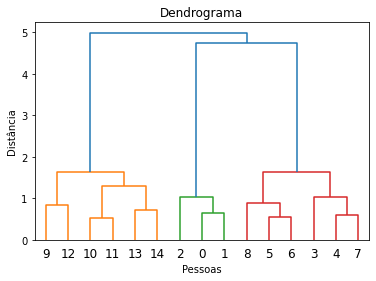

In [54]:
dendrograma = dendrogram(linkage(base_salario, method='ward'))
plt.title('Dendrograma')
plt.xlabel('Pessoas')
plt.ylabel('Distância');

In [55]:
from sklearn.cluster import AgglomerativeClustering

In [56]:
hc_salario = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean')
rotulos = hc_salario.fit_predict(base_salario)

In [57]:
rotulos

array([2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0])

In [58]:
grafico = px.scatter(x = base_salario[:,0], y = base_salario[:,1], color = rotulos)
grafico.show()

# Base cartão de crédito

In [59]:
x_cartao

array([[-1.13672015, -0.65287357],
       [-0.3659805 , -0.67110616],
       [-0.59720239, -0.39944197],
       ...,
       [-1.05964618, -0.65353072],
       [-0.67427636, -0.16546639],
       [-0.90549825, -0.02494681]])

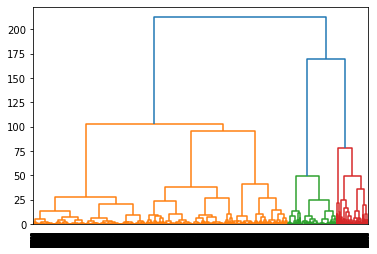

In [64]:
dendrograma = dendrogram(linkage(x_cartao, method = 'ward'))

In [65]:
hc_cartao = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage = 'ward')
rotulos = hc_cartao.fit_predict(x_cartao)

In [66]:
rotulos

array([0, 0, 0, ..., 0, 0, 0])

In [67]:
grafico = px.scatter(x = x_cartao[:,0], y = x_cartao[:,1], color = rotulos)
grafico.show()

# DBSCAN

## Base salário idade

In [68]:
base_salario

array([[-1.87963884, -1.11413572],
       [-1.23255006, -1.01725435],
       [-1.78719758, -0.19376273],
       [-0.30813751, -0.70238991],
       [ 0.52383377, -1.1625764 ],
       [ 1.17092255, -1.13835606],
       [ 1.35580506, -0.62972888],
       [ 0.61627503, -0.5812882 ],
       [ 1.0784813 , -0.14532205],
       [-0.77034379,  1.25945777],
       [-0.12325501,  0.38752547],
       [ 0.0616275 ,  0.8719323 ],
       [-0.12325501,  1.79230528],
       [ 0.70871628,  0.82349162],
       [ 0.70871628,  1.55010187]])

In [69]:
from sklearn.cluster import DBSCAN

In [70]:
dbscan_salario = DBSCAN(eps = 0.95, min_samples=2)
dbscan_salario.fit(base_salario)

DBSCAN(eps=0.95, min_samples=2)

In [71]:
rotulos = dbscan_salario.labels_
rotulos

array([0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2])

In [72]:
grafico = px.scatter(x = base_salario[:,0], y = base_salario[:,1], color = rotulos)
grafico.show()

## Base cartão de crédito

In [73]:
x_cartao

array([[-1.13672015, -0.65287357],
       [-0.3659805 , -0.67110616],
       [-0.59720239, -0.39944197],
       ...,
       [-1.05964618, -0.65353072],
       [-0.67427636, -0.16546639],
       [-0.90549825, -0.02494681]])

In [74]:
dbscan_cartao = DBSCAN(eps=0.37, min_samples=5)
rotulos = dbscan_cartao.fit_predict(x_cartao)

In [75]:
rotulos

array([0, 0, 0, ..., 0, 0, 0])

In [76]:
np.unique(rotulos, return_counts=True)

(array([-1,  0]), array([   55, 29945]))

In [77]:
grafico = px.scatter(x = x_cartao[:,0], y = x_cartao[:,1], color = rotulos)
grafico.show()

# K-means x Hierárquico x DBSCAN

In [78]:
from sklearn import datasets

In [79]:
x_random, y_random = datasets.make_moons(n_samples=1500, noise = 0.09)

In [80]:
x_random

array([[0.65172264, 0.4778168 ],
       [0.15531071, 1.16710579],
       [0.17966736, 0.82335019],
       ...,
       [0.60545765, 1.0342681 ],
       [0.08004551, 0.46983865],
       [0.81113045, 0.68577299]])

In [81]:
y_random

array([0, 0, 0, ..., 0, 1, 0])

In [82]:
np.unique(y_random)

array([0, 1])

In [84]:
grafico = px.scatter(x = x_random[:,0], y = x_random[:,1])
grafico.show()

In [85]:
kmeans = KMeans(n_clusters=2)
rotulos = kmeans.fit_predict(x_random)
grafico = px.scatter(x = x_random[:,0], y = x_random[:, 1], color = rotulos)
grafico.show()

In [86]:
hc = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
rotulos = hc.fit_predict(x_random)
grafico = px.scatter(x = x_random[:,0], y = x_random[:, 1], color = rotulos)
grafico.show()

In [87]:
dbscan = DBSCAN(eps=0.1)
rotulos = dbscan.fit_predict(x_random)
grafico = px.scatter(x = x_random[:,0], y = x_random[:, 1], color = rotulos)
grafico.show()